<a href="https://colab.research.google.com/github/RizkyaSalsabila/Assigenment-Sem2_Rizkyaa/blob/main/CM1_KELOMPOK_5_3D_TI.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Praktikum Pengolahan Citra dan Visi Komputer

**Kelompok 3 - Kelas B**  
| No | Nama Anggota | NIM
|----|---------------|------
| 1 | Key Firdausi Alfarel | 2341720186
| 2 | Rizkya Salsabila | 2341720056
| 3 | Tora Digda Kristiawan | 2341720161

**Dosen Pengampu:** Ibu Dr. Ulla Delfana Rosiani, S.T.,M.T.  
**Mata Kuliah:** Pengolahan Citra dan Visi Komputer  
**Semester:** 5 (Ganjil 2025/2026)  

---

**Tanggal Praktikum:** 6 Oktober 2025  
**Tujuan:**  
Meningkatkan kualitas dan keterbacaan fitur wajah agar siap untuk proses *face recognition* melalui tahapan peningkatan kecerahan, kontras, filtering, dan penajaman fitur.

---



# Langkah Awal - Connect Google Drive and Import Library

In [ ]:
# --- instalasi Library Tambahan ---

# untuk deteksi wajah
!pip install mtcnn

# untuk pengolahan citra
!pip install opencv-python

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 17.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 17.6 MB/s eta 0:00:00


In [ ]:
# library utama untuk pengolahan citra (membaca, memproses, menampilkan)
import cv2

# mengelola path dan file directory
import os

# deteksi wajah otomatis menggunakan MTCNN
from mtcnn import MTCNN

# visualisasi gambar dan grafik (misalnya histogram)
import matplotlib.pyplot as plt

# operasi numerik dan matriks (digunakan untuk representasi citra)
import numpy as np

# membaca banyak file dengan pola tertentu (misal *.jpg)
import glob

# menampilkan gambar di Google Colab
from google.colab.patches import cv2_imshow

# analisis dan pengolahan data hasil percobaan
import pandas as pd

In [ ]:
# menghubungkan Google Colab dengan Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Bagian A – Observasi & Eksperimen

## 1. Crop Image

In [ ]:
# path folder utama
folder_path = "/content/drive/MyDrive/Polinema/tugasSemester5/PengolahanCitradanVisiKomputer/Pertemuan 7"
# path folder output untuk menyimpan hasil crop
output_folder = os.path.join(folder_path, "cropted")

# membuat folder output jika belum ada
os.makedirs(output_folder, exist_ok=True)

# inisialisasi detektor wajah MTCNN
detector = MTCNN()

# loop untuk membaca setiap file dalam folder utama
for filename in os.listdir(folder_path):
    img_path = os.path.join(folder_path, filename)

    # lewati folder "cropted" agar tidak memproses ulang hasil crop
    if filename == "cropted":
        continue

    # membaca file gambar
    img = cv2.imread(img_path)

    # jika file tidak dapat dibaca sebagai gambar, maka dilewati
    if img is None:
        print(f"File dilewati (bukan gambar): {filename}")
        continue

    # konversi format tampilan
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # deteksi wajah menggunakan MTCNN
    faces = detector.detect_faces(img_rgb)
    print(f"{filename}: jumlah wajah terdeteksi = {len(faces)}")

    # menampilkan gambar asli dan hasil crop
    plt.figure(figsize=(8, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(img_rgb)
    plt.title("Foto Asli")
    plt.axis('off')

    # jika wajah terdeteksi, lakukan cropping pada area wajah pertama
    if faces:
        x, y, w, h = faces[0]['box']
        x, y = max(0, x), max(0, y)
        face_crop = img_rgb[y:y+h, x:x+w]

        # menyimpan hasil crop ke folder output
        base_name = os.path.splitext(filename)[0]  # ambil nama tanpa ekstensi
        output_path = os.path.join(output_folder, f"{base_name}_cropt.jpg")
        cv2.imwrite(output_path, cv2.cvtColor(face_crop, cv2.COLOR_RGB2BGR))
        print(f"Hasil crop disimpan ke: {output_path}"

        # menampilkan hasil crop
        plt.subplot(1, 2, 2)
        plt.imshow(face_crop)
        plt.title("Hasil Crop")
        plt.axis('off')
    else:
        # jika tidak ada wajah terdeteksi
        plt.subplot(1, 2, 2)
        plt.text(0.5, 0.5, 'Tidak ada wajah terdeteksi', ha='center', va='center', fontsize=12)
        plt.axis('off')

    plt.suptitle(filename)
    plt.show()
    plt.pause(0.1)

## 2. Tampilkan histogram tiap citra dan analisis distribusi intensitasnya.

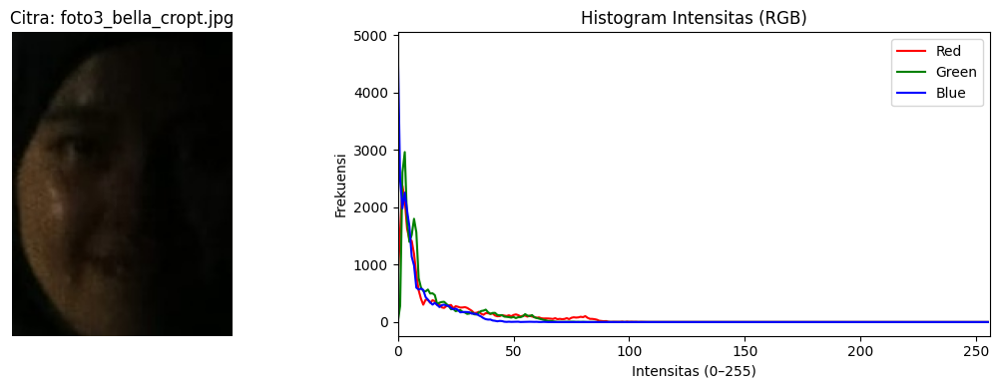

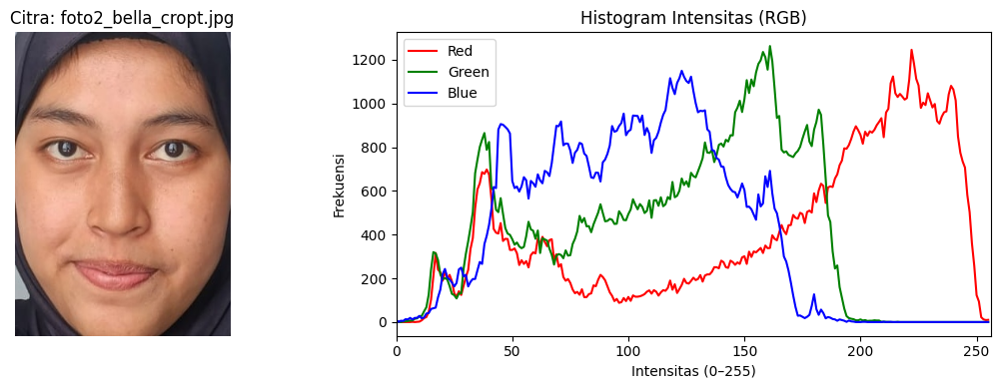

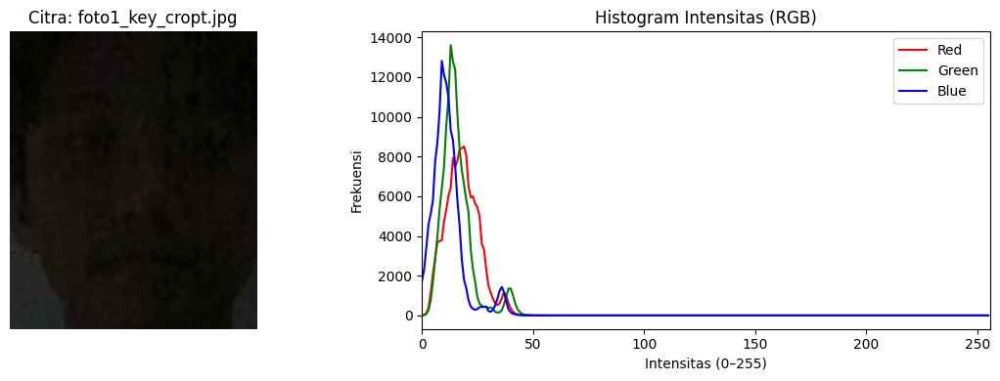

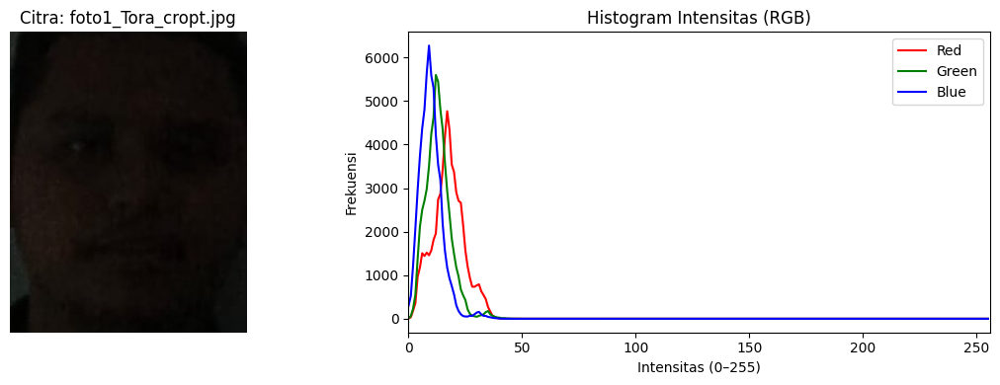

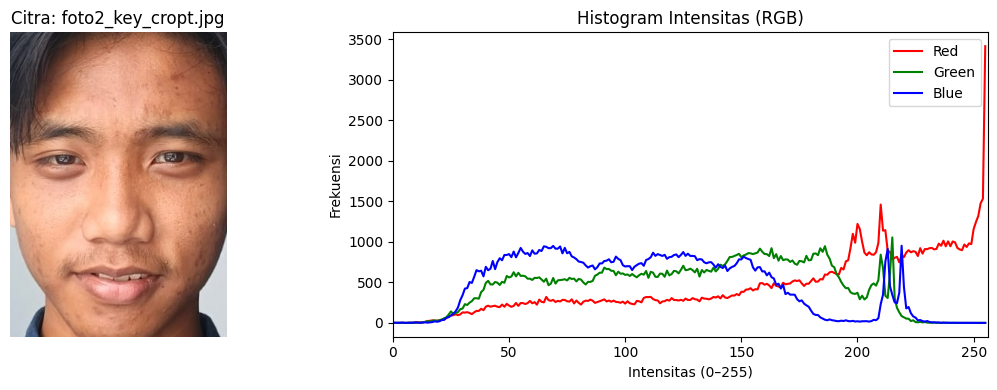

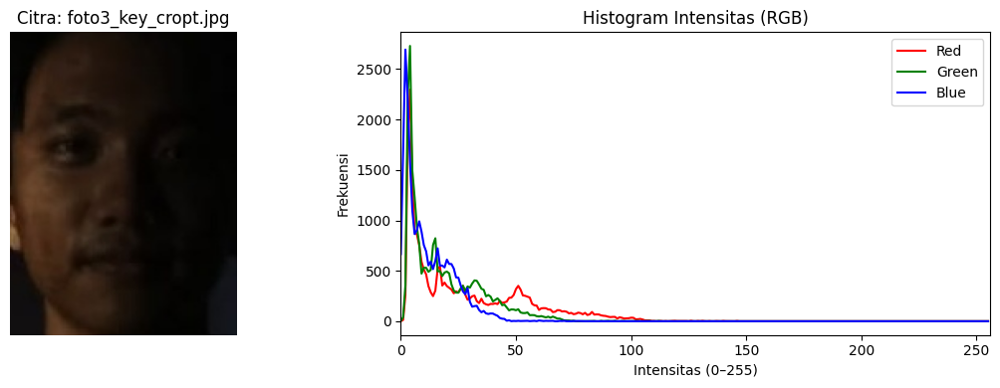

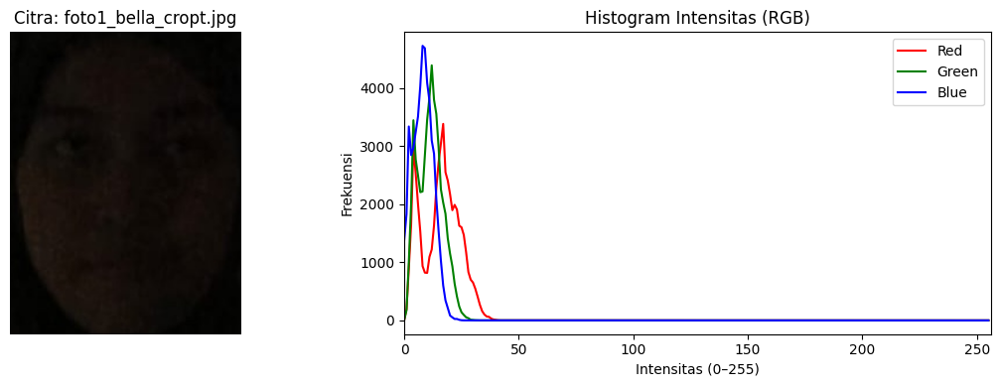

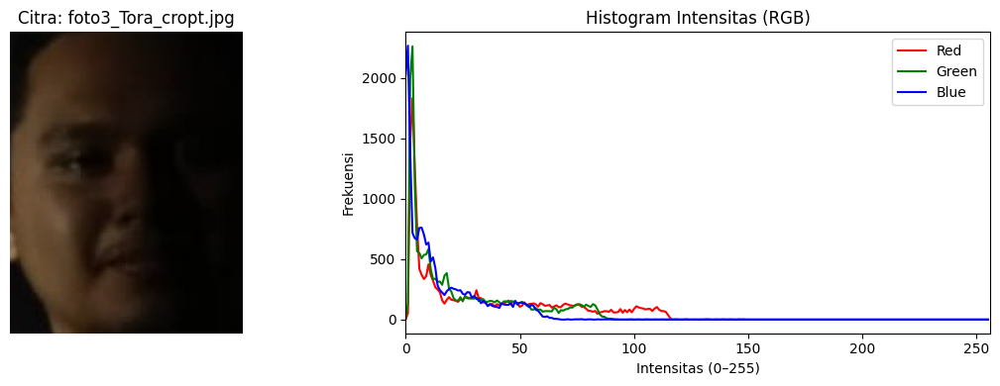

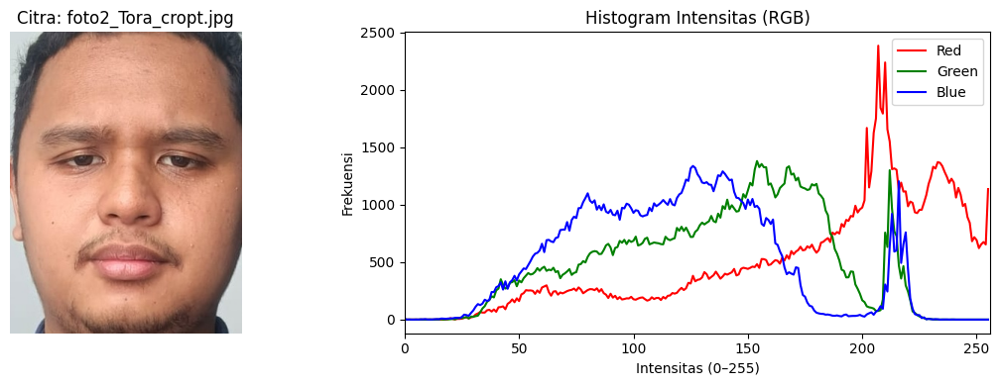

In [ ]:
# ambil semua gambar hasil crop dari folder
image_paths = glob.glob('/content/drive/MyDrive/PCVK_KELOMPOK 5/Foto/cropted/*.jpg')

for path in image_paths:
    # baca citra berwarna
    img_bgr = cv2.imread(path)
    if img_bgr is None:
        print(f"Tidak dapat membaca file: {path}")
        continue # lewati file yang gagal dibaca

    # konversi dari BGR ke RGB
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(12,4))

    # tampilkan citra asli
    plt.subplot(1,2,1)
    plt.imshow(img_rgb)
    plt.title(f"Citra: {path.split('/')[-1]}")
    plt.axis('off')

    # hitung dan tampilkan histogram untuk tiap channel (R, G, B)
    plt.subplot(1,2,2)
    colors = ('r', 'g', 'b')
    for i, color in enumerate(colors):
        hist = cv2.calcHist([img_rgb], [i], None, [256], [0,256])
        plt.plot(hist, color=color)
        plt.xlim([0,256])

    plt.title('Histogram Intensitas (RGB)')
    plt.xlabel('Intensitas (0–255)')
    plt.ylabel('Frekuensi')
    plt.legend(['Red','Green','Blue'])
    plt.tight_layout()
    plt.show()

Hasil Analisis Berdasarkan Histogram :
1. foto1
  => Histogram menunjukkan distribusi intensitas yang terkonsentrasi di rentang rendah (0-50) pada ketiga channel RGB. Hal ini menandakan citra sangat gelap dan kekurangan pencahayaan, dengan warna dominan abu-abu tua atau hitam. Tidak ada sebaran di area intensitas tinggi, sehingga detail objek sulit terlihat dan kontrasnya rendah.

2. foto2
  => Distribusi intensitas menyebar di rentang tinggi (150-250), dengan puncak jelas pada channel merah dan hijau. Citra tampak terang dengan pencahayaan cukup dan warna alami. Perbedaan antar channel tidak terlalu besar, menandakan keseimbangan warna yang baik serta kontras yang memadai sehingga detail wajah terlihat jelas.

3. foto3
  => Histogram menunjukkan mayoritas intensitas berada di bawah nilai 60. Citra ini cenderung gelap dengan sedikit highlight di bagian wajah, menunjukkan kondisi pencahayaan yang kurang merata.

## 3. Terapkan transformasi brightness dan contrast (linear/log brightness)
### - Tentukan nilai b (brightness) dan a (contrast) yang sesuai agar wajah tampak natural.

### 1. Gambar Gelap (foto1)

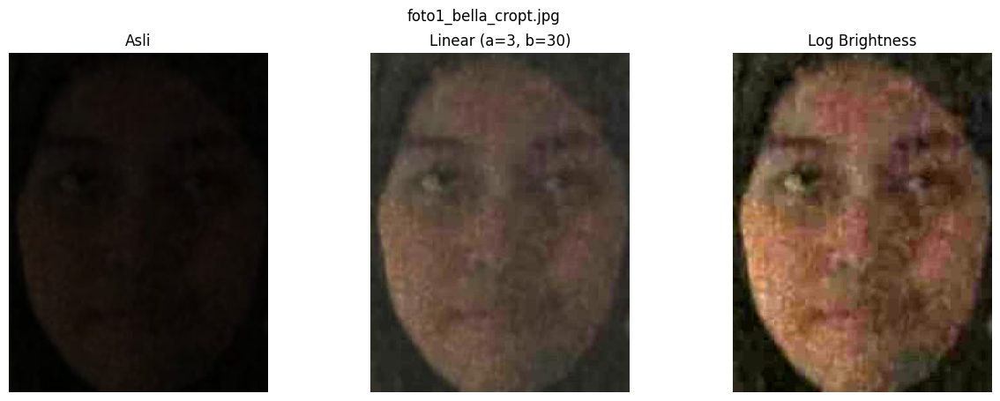

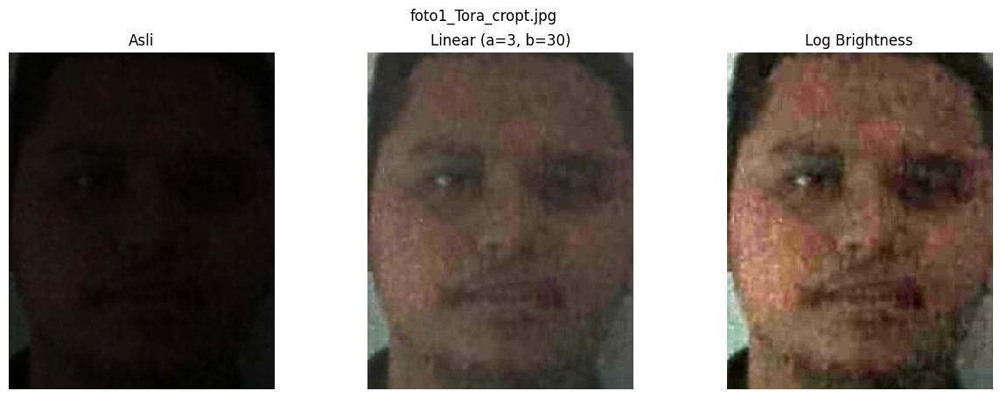

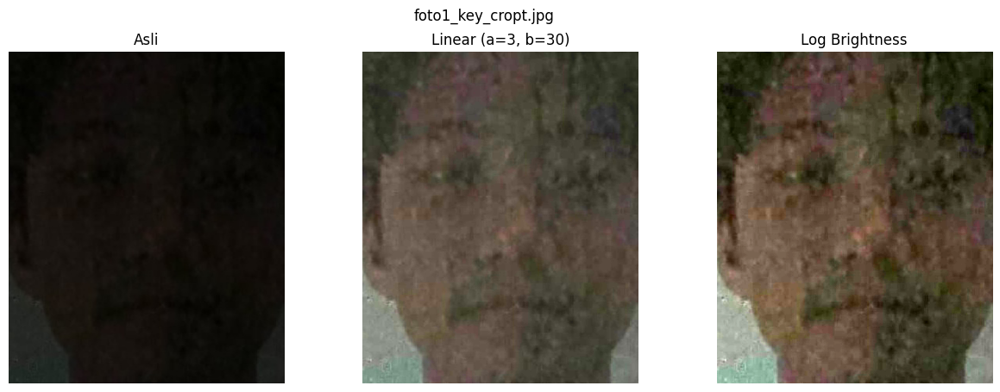

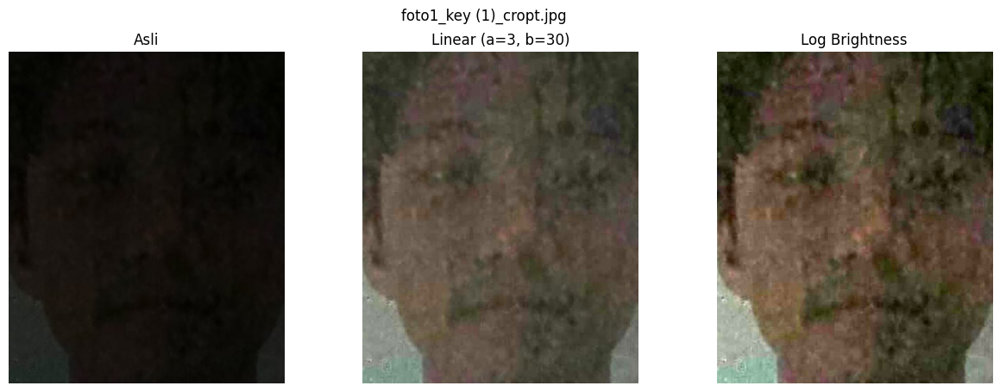

In [ ]:
# folder berisi wajah yang sudah di-crop
folder_path = "/content/drive/MyDrive/Tugas Kuliah Sem-5/Computer Vision/Pertemuan-007/Assets/cropted"

# fungsi transformasi brightness dan contrast
def apply_linear(img, a=1.0, b=0):
    """Linear transform: I_out = a*I + b"""
    out = a * img.astype(np.float32) + b
    out = np.clip(out, 0, 255).astype(np.uint8)
    return out

def apply_log(img):
    """Log brightness transform dengan normalisasi"""
    img_f = img.astype(np.float32)
    img_norm = img_f / 255.0
    c = 255 / np.log(1 + np.max(img_norm))
    out = c * np.log(1 + img_norm)
    out = np.clip(out, 0, 255).astype(np.uint8)
    return out

# parameter brightness dan contrast
a = 3
b = 30

# loop semua file yang diawali "foto1_"
for filename in os.listdir(folder_path):
    if filename.lower().startswith("foto1_"):
        img_path = os.path.join(folder_path, filename)
        img = cv2.imread(img_path)

        if img is None:
            print(f"Gagal membaca file: {filename}")
            continue

        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # proses transformasi
        linear_result = apply_linear(img_rgb, a=a, b=b)
        log_result = apply_log(img_rgb)

        # tampilkan hasil perbandingan
        plt.figure(figsize=(15,5))

        # citra asli
        plt.subplot(1,3,1)
        plt.imshow(img_rgb)
        plt.title("Asli")
        plt.axis("off")

        # hasil transformasi linear
        plt.subplot(1,3,2)
        plt.imshow(linear_result)
        plt.title(f"Linear (a={a}, b={b})")
        plt.axis("off")

        # hasil transformasi log brightness
        plt.subplot(1,3,3)
        plt.imshow(log_result)
        plt.title("Log Brightness")
        plt.axis("off")

        plt.suptitle(filename)
        plt.show()
        plt.pause(0.1)

### 2. Gambar Terang (foto2)

✅ Disimpan: /content/drive/MyDrive/Polinema/tugasSemester5/PengolahanCitradanVisiKomputer/Pertemuan 7/cropted/../brightness/foto2_Tora_cropt_brightness.jpg
✅ Disimpan: /content/drive/MyDrive/Polinema/tugasSemester5/PengolahanCitradanVisiKomputer/Pertemuan 7/cropted/../log/foto2_Tora_cropt_log.jpg


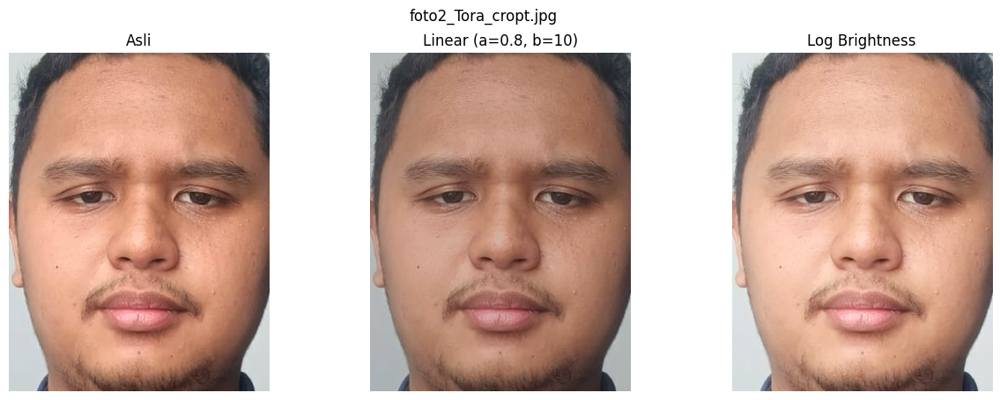

✅ Disimpan: /content/drive/MyDrive/Polinema/tugasSemester5/PengolahanCitradanVisiKomputer/Pertemuan 7/cropted/../brightness/foto2_key_cropt_brightness.jpg
✅ Disimpan: /content/drive/MyDrive/Polinema/tugasSemester5/PengolahanCitradanVisiKomputer/Pertemuan 7/cropted/../log/foto2_key_cropt_log.jpg


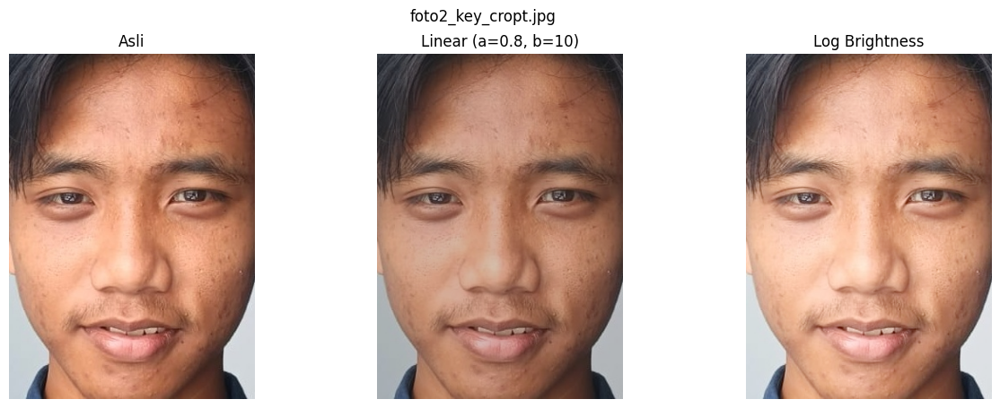

✅ Disimpan: /content/drive/MyDrive/Polinema/tugasSemester5/PengolahanCitradanVisiKomputer/Pertemuan 7/cropted/../brightness/foto2_bella_cropt_brightness.jpg
✅ Disimpan: /content/drive/MyDrive/Polinema/tugasSemester5/PengolahanCitradanVisiKomputer/Pertemuan 7/cropted/../log/foto2_bella_cropt_log.jpg


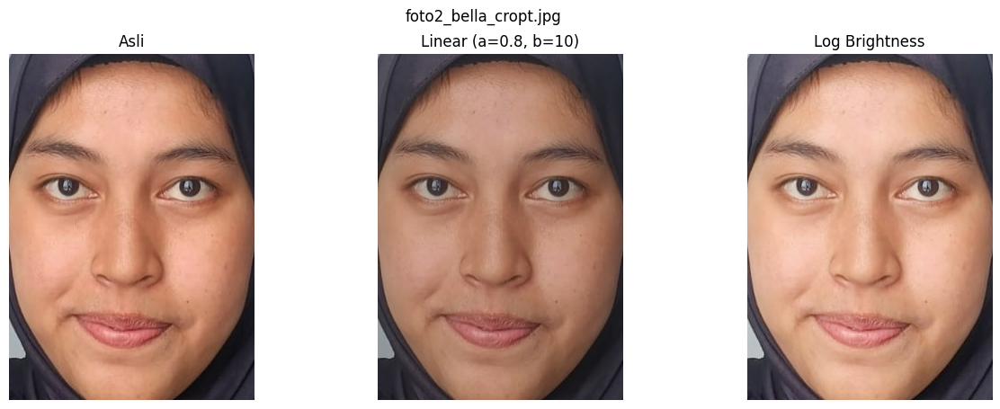

In [ ]:
# folder berisi wajah yang sudah di-crop
folder_path = "/content/drive/MyDrive/Polinema/tugasSemester5/PengolahanCitradanVisiKomputer/Pertemuan 7/cropted"

# folder output untuk hasil transformasi brightness dan log brightness
brightness_folder = os.path.join(folder_path, "../brightness")
log_folder = os.path.join(folder_path, "../log")

# membuat folder output jika belum ada
os.makedirs(brightness_folder, exist_ok=True)
os.makedirs(log_folder, exist_ok=True)

# fungsi transformasi linear (brightness & contrast)
# > rumus: I_out = a * I + b
def apply_linear(img, a=1.0, b=0):
    """Linear transform: I_out = a*I + b"""
    out = a * img.astype(np.float32) + b
    out = np.clip(out, 0, 255).astype(np.uint8)
    return out

# fungsi transformasi log brightness
# > rumus: I_out = c * log(1 + I_norm)
def apply_log(img):
    """Log brightness transform dengan normalisasi"""
    img_f = img.astype(np.float32)
    img_norm = img_f / 255.0
    c = 255 / np.log(1 + np.max(img_norm))
    out = c * np.log(1 + img_norm)
    out = np.clip(out, 0, 255).astype(np.uint8)
    return out

# parameter brightness dan contrast
# a = faktor kontras, b = nilai penambah kecerahan
a = 0.8
b = 10

# variabel untuk menyimpan hasil transformasi
brightness_results = {}
log_results = {}

# melakukan proses transformasi pada setiap file dengan awalan nama "foto2_"
for filename in os.listdir(folder_path):
    if filename.lower().startswith("foto2_"):
        img_path = os.path.join(folder_path, filename)
        img = cv2.imread(img_path)

        # cek apakah file berhasil dibaca
        if img is None:
            print(f"Gagal membaca: {filename}")
            continue

        # konversi citra dari BGR ke RGB
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # menerapkan transformasi linear dan log brightness
        linear_result = apply_linear(img_rgb, a=a, b=b)
        log_result = apply_log(img_rgb)

        # simpan hasil ke dalam variabel dictionary
        brightness_results[filename] = linear_result
        log_results[filename] = log_result

        # menentukan path penyimpanan hasil
        name, ext = os.path.splitext(filename)
        brightness_path = os.path.join(brightness_folder, f"{name}_brightness{ext}")
        log_path = os.path.join(log_folder, f"{name}_log{ext}")

        # simpan hasil transformasi ke folder output
        cv2.imwrite(brightness_path, cv2.cvtColor(linear_result, cv2.COLOR_RGB2BGR))
        cv2.imwrite(log_path, cv2.cvtColor(log_result, cv2.COLOR_RGB2BGR))

        print(f"Disimpan: {brightness_path}")
        print(f"Disimpan: {log_path}")

        # tampilkan hasil perbandingan (asli, linear, log)
        plt.figure(figsize=(15,5))

        plt.subplot(1,3,1)
        plt.imshow(img_rgb)
        plt.title("Asli")
        plt.axis("off")

        plt.subplot(1,3,2)
        plt.imshow(linear_result)
        plt.title(f"Linear (a={a}, b={b})")
        plt.axis("off")

        plt.subplot(1,3,3)
        plt.imshow(log_result)
        plt.title("Log Brightness")
        plt.axis("off")

        plt.suptitle(filename)
        plt.show()
        plt.pause(0.1)

### 3. Foto Jendela (foto3)

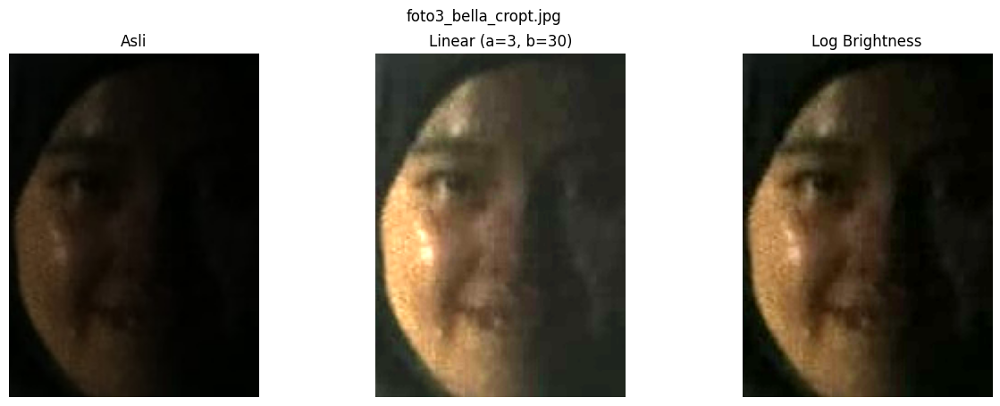

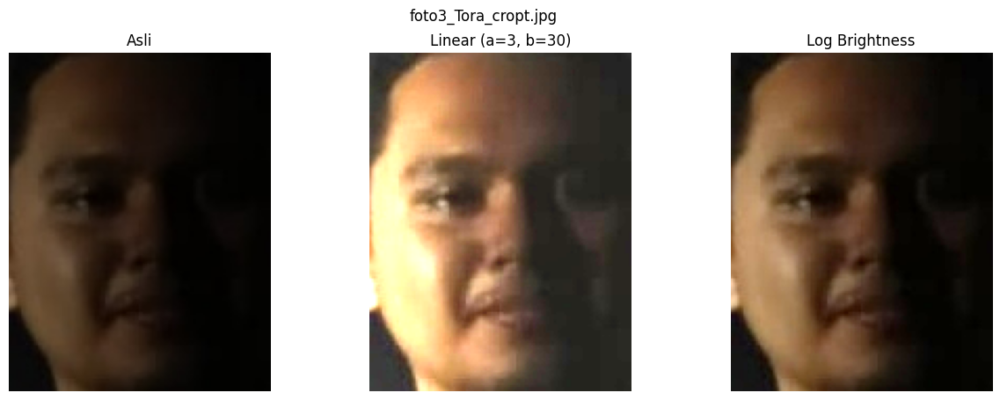

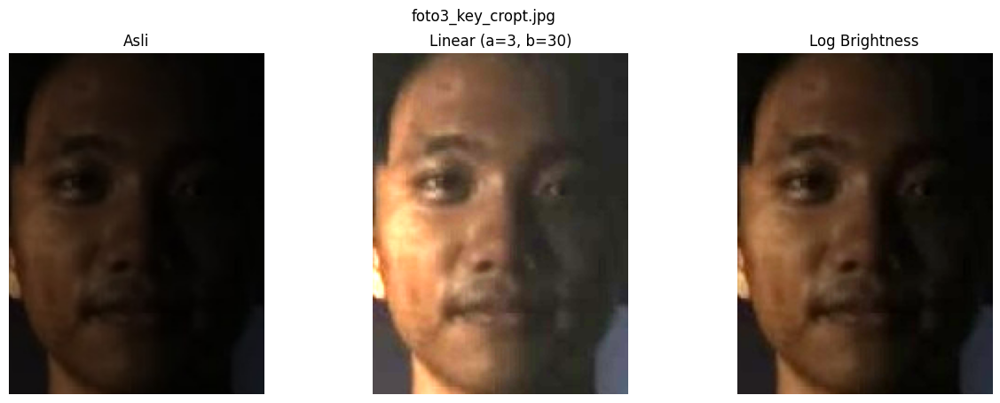

In [ ]:
# folder input berisi wajah yang sudah di-crop
folder_path = "/content/drive/MyDrive/Tugas Kuliah Sem-5/Computer Vision/Pertemuan-007/Assets/cropted"

# folder output untuk hasil transformasi brightness dan log brightness
brightness_folder = os.path.join(folder_path, "../brightness")
log_folder = os.path.join(folder_path, "../log")

# membuat folder output jika belum ada
os.makedirs(brightness_folder, exist_ok=True)
os.makedirs(log_folder, exist_ok=True)

# fungsi transformasi linear (menyesuaikan brightness dan contrast)
# > rumus: I_out = a * I + b
def apply_linear(img, a=1.0, b=0):
    """Linear transform: I_out = a*I + b"""
    out = a * img.astype(np.float32) + b
    out = np.clip(out, 0, 255).astype(np.uint8)
    return out

# fungsi transformasi log brightness dengan normalisasi
# > rumus: I_out = c * log(1 + I_norm)
def apply_log(img):
    """Log brightness transform dengan normalisasi"""
    img_f = img.astype(np.float32)
    img_norm = img_f / 255.0
    c = 255 / np.log(1 + np.max(img_norm))
    out = c * np.log(1 + img_norm)
    out = np.clip(out, 0, 255).astype(np.uint8)
    return out

# parameter transformasi
# a = faktor kontras (lebih besar dari 1 untuk menambah kontras)
# b = faktor kecerahan (menambah nilai intensitas)
a = 3
b = 30

# proses transformasi untuk semua file yang diawali dengan nama "foto3_"
for filename in os.listdir(folder_path):
    if filename.lower().startswith("foto3_"):
        img_path = os.path.join(folder_path, filename)
        img = cv2.imread(img_path)

        # cek apakah file citra berhasil dibaca
        if img is None:
            print(f"Gagal membaca: {filename}")
            continue

        # konversi dari format BGR ke RGB
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # menerapkan transformasi linear dan log brightness
        linear_result = apply_linear(img_rgb, a=a, b=b)
        log_result = apply_log(img_rgb)

        # menentukan nama file hasil transformasi
        name, ext = os.path.splitext(filename)  # Pisahkan nama & ekstensi
        brightness_path = os.path.join(brightness_folder, f"{name}_brightness{ext}")
        log_path = os.path.join(log_folder, f"{name}_log{ext}")

        # menyimpan hasil transformasi ke folder output
        cv2.imwrite(brightness_path, cv2.cvtColor(linear_result, cv2.COLOR_RGB2BGR))
        cv2.imwrite(log_path, cv2.cvtColor(log_result, cv2.COLOR_RGB2BGR))

        print(f"Disimpan: {brightness_path}")
        print(f"Disimpan: {log_path}")

        # menampilkan hasil perbandingan antara citra asli, linear, dan log
        plt.figure(figsize=(15,5))
        plt.subplot(1,3,1)
        plt.imshow(img_rgb)
        plt.title("Asli")
        plt.axis("off")

        plt.subplot(1,3,2)
        plt.imshow(linear_result)
        plt.title(f"Linear (a={a}, b={b})")
        plt.axis("off")

        plt.subplot(1,3,3)
        plt.imshow(log_result)
        plt.title("Log Brightness")
        plt.axis("off")

        plt.suptitle(filename)
        plt.show()
        plt.pause(0.1)

## 4. Lakukan histogram equalization untuk memperbaiki sebaran kontras.
### - Bandingkan hasil visual dan histogram sebelum–sesudah.

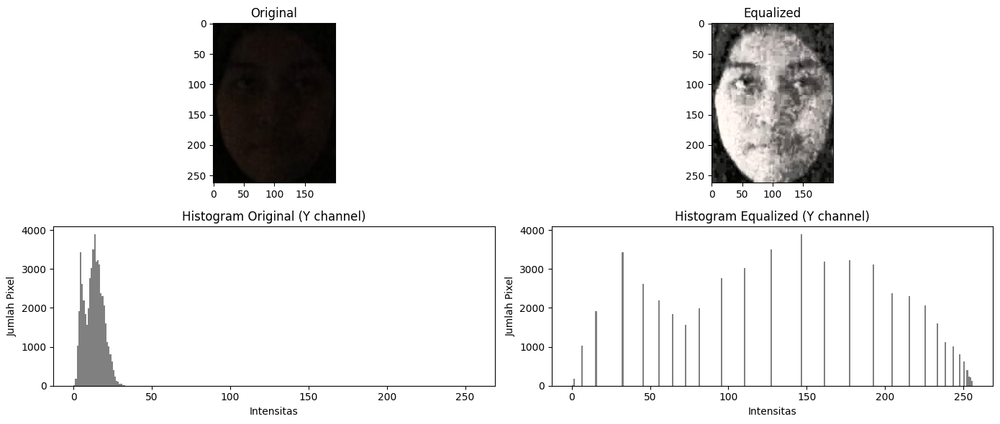

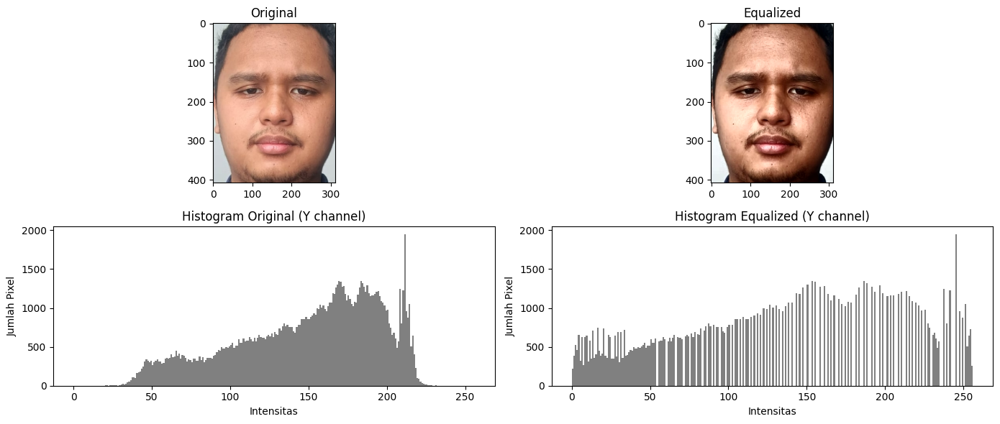

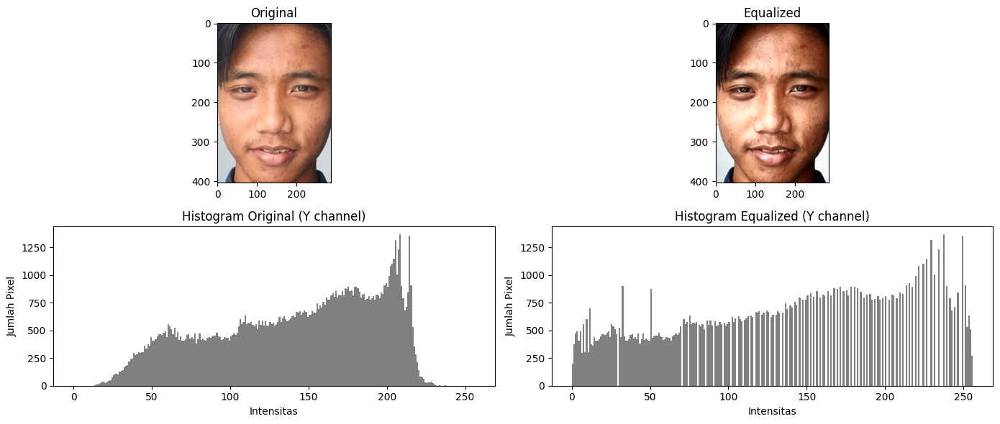

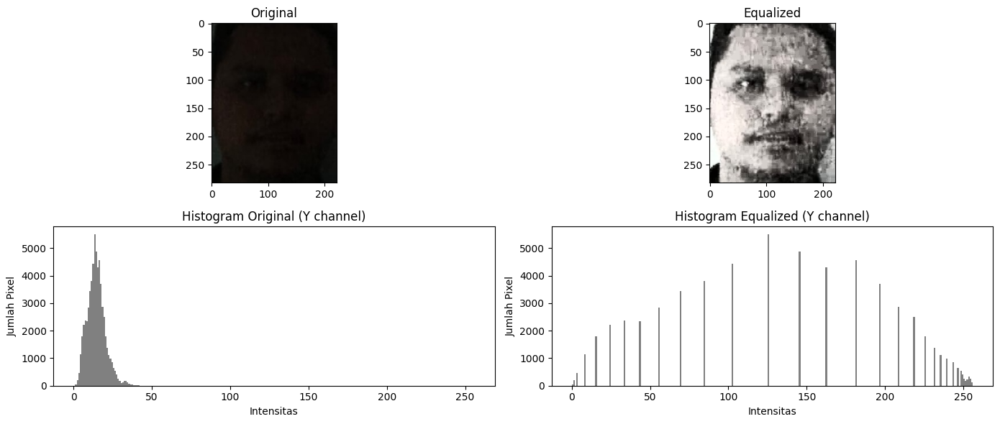

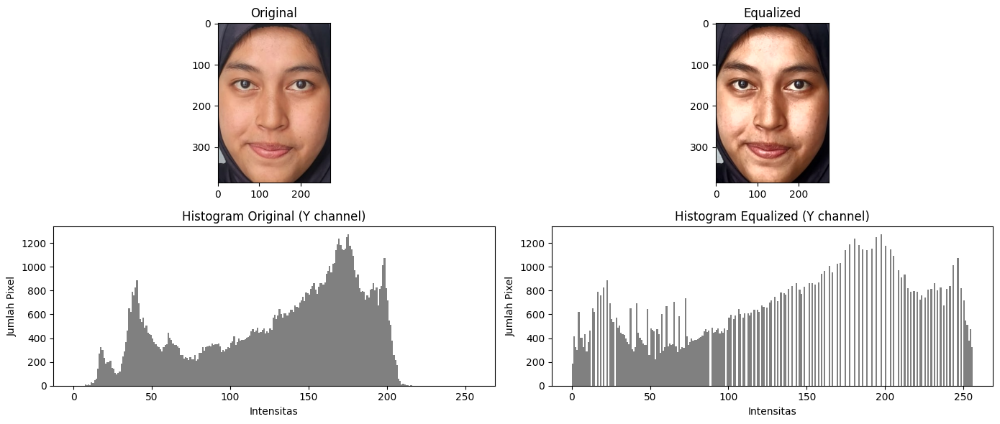

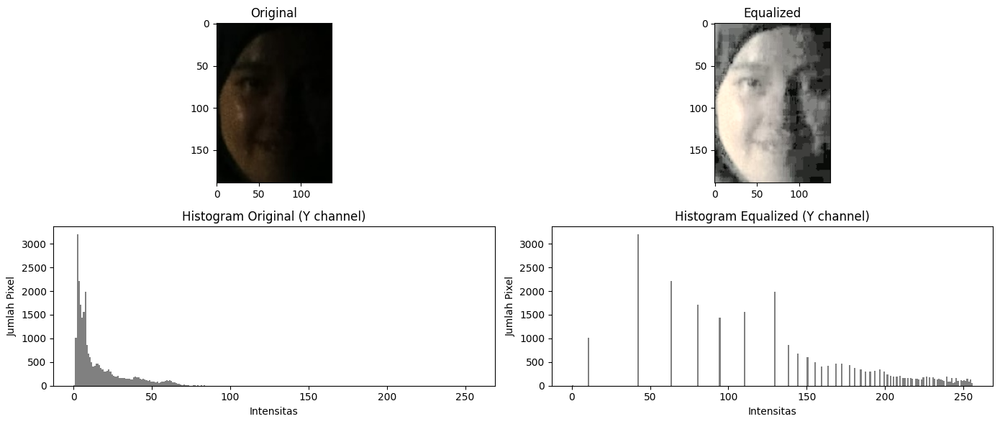

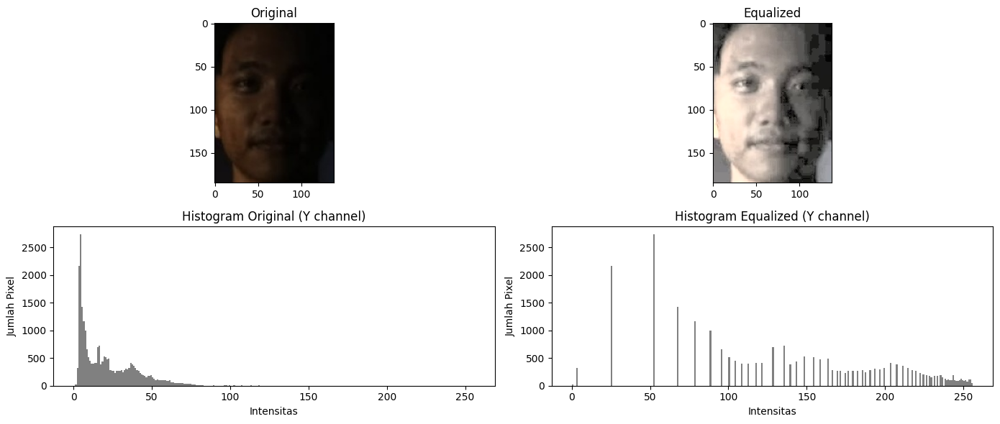

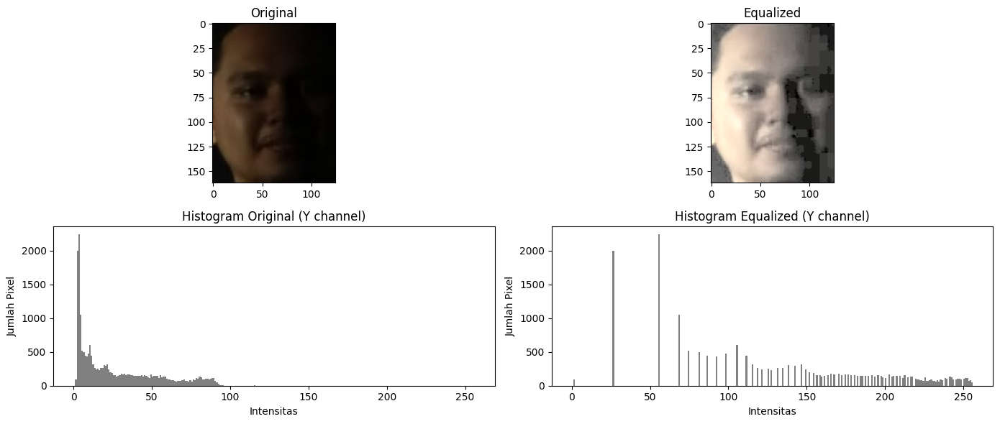

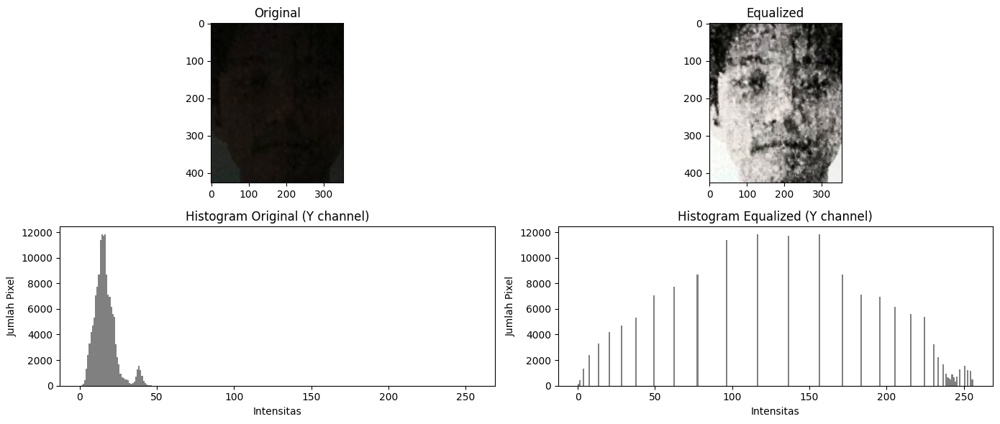

In [ ]:
# folder input berisi citra hasil crop wajah
folder_path = "/content/drive/MyDrive/Polinema/tugasSemester5/PengolahanCitradanVisiKomputer/Pertemuan 7/cropted"
image_paths = glob.glob(folder_path + "/*.*")

# variabel untuk menyimpan hasil equalization
equalization_results = {}

# loop untuk memproses setiap gambar dalam folder
for path in image_paths:
    filename = os.path.basename(path)  # ambil nama file

    # baca citra dalam format BGR
    img = cv2.imread(path)

    # konversi citra ke ruang warna YCrCb (Y = luminance, Cr & Cb = chrominance)
    ycrcb = cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    y, cr, cb = cv2.split(ycrcb)

    # lakukan histogram equalization hanya pada channel luminance (Y)
    y_eq = cv2.equalizeHist(y)

    # gabungkan kembali channel yang sudah di-equalize dengan Cr dan Cb
    ycrcb_eq = cv2.merge([y_eq, cr, cb])

    # konversi kembali ke ruang warna BGR
    img_eq = cv2.cvtColor(ycrcb_eq, cv2.COLOR_YCrCb2BGR)

    # simpan hasil equalization hanya untuk gambar dengan awalan "foto2_"
    if "foto2" in filename.lower():
        # Simpan hasil ke variabel
        equalization_results[filename] = img_eq

    # menampilkan perbandingan citra dan histogram
    plt.figure(figsize=(14,6))

    # tampilkan citra asli
    plt.subplot(2,2,1)
    plt.title("Original")
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

    # tampilkan citra setelah equalization
    plt.subplot(2,2,2)
    plt.title("Equalized")
    plt.imshow(cv2.cvtColor(img_eq, cv2.COLOR_BGR2RGB))

    # histogram channel Y sebelum equalization
    plt.subplot(2,2,3)
    plt.title("Histogram Original (Y channel)")
    plt.hist(y.ravel(), bins=256, range=[0,256], color='gray')
    plt.xlabel("Intensitas")
    plt.ylabel("Jumlah Pixel")

    # histogram channel Y sesudah equalization
    plt.subplot(2,2,4)
    plt.title("Histogram Equalized (Y channel)")
    plt.hist(y_eq.ravel(), bins=256, range=[0,256], color='gray')
    plt.xlabel("Intensitas")
    plt.ylabel("Jumlah Pixel")

    plt.tight_layout()
    plt.show()
    # plt.suptitle(filename)
    # plt.pause(0.1)

## 5. Terapkan filter spasial:
### • Low-pass filter untuk menghaluskan noise kulit wajah.
### • High-pass atau Laplacian filter untuk menajamkan tepi mata dan bibir.

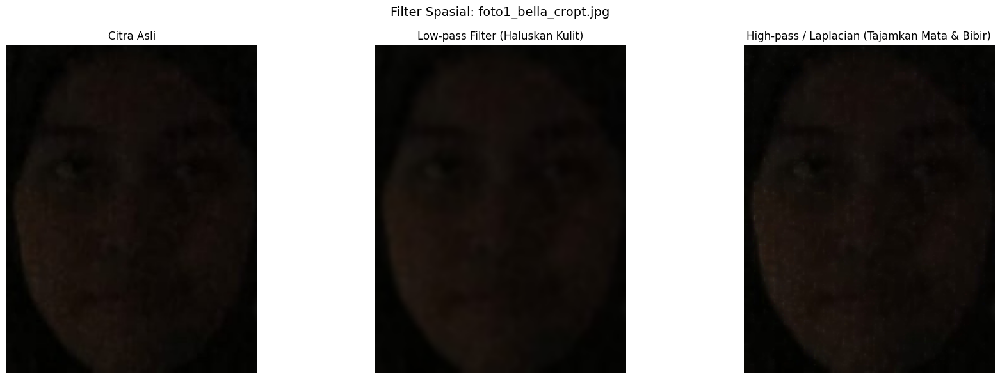

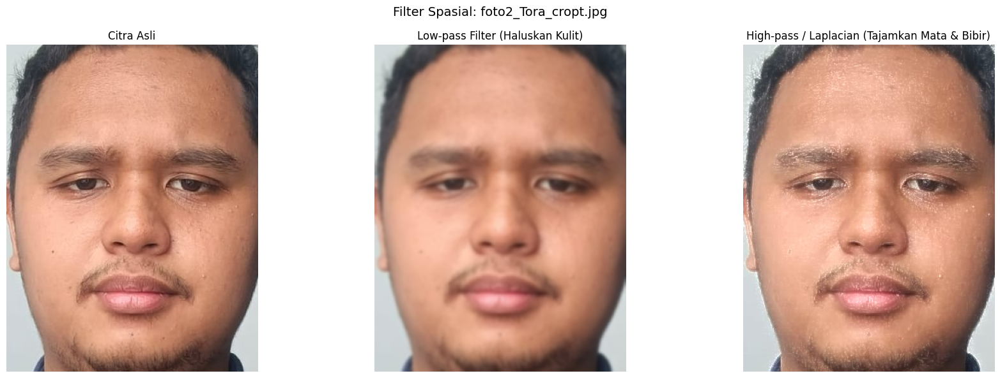

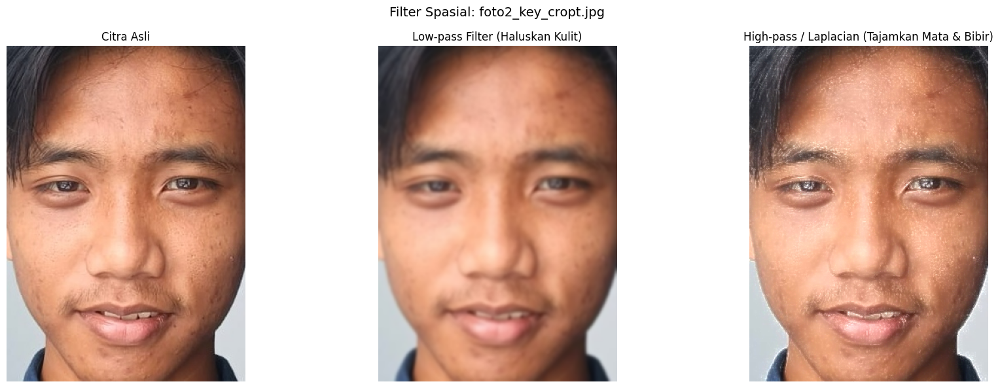

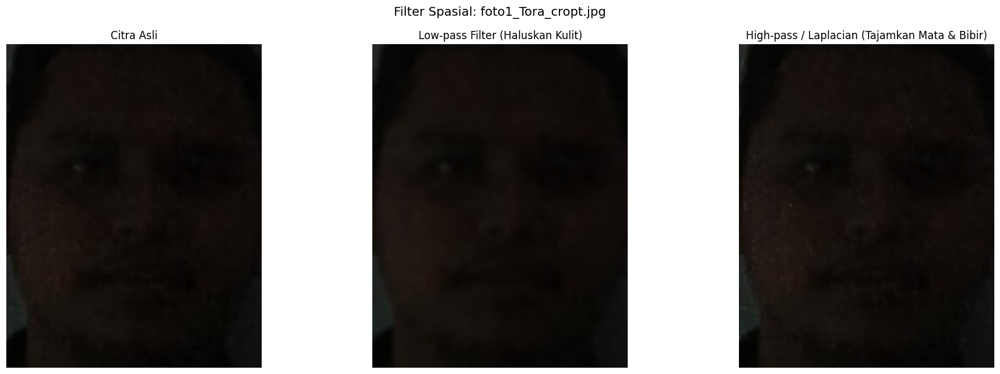

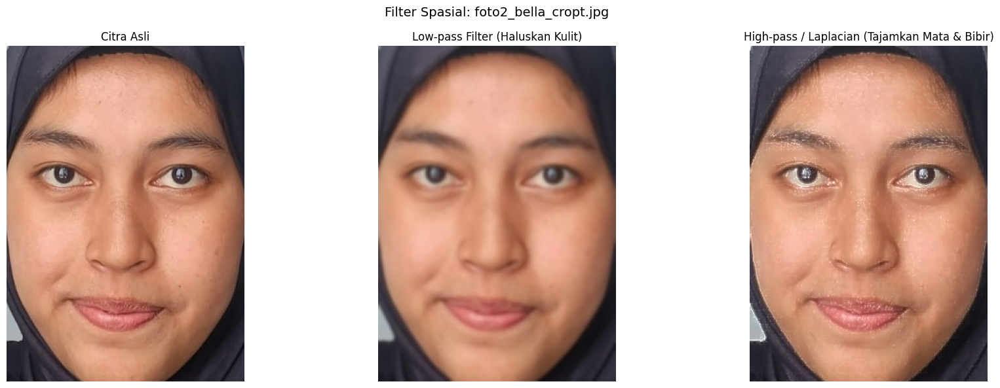

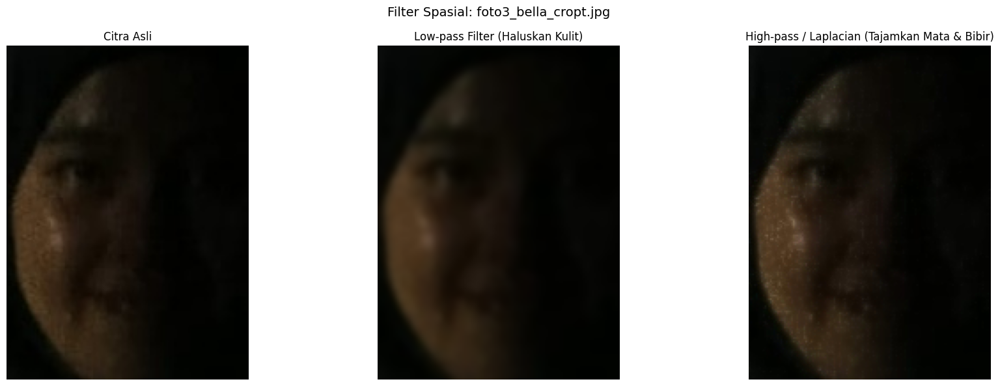

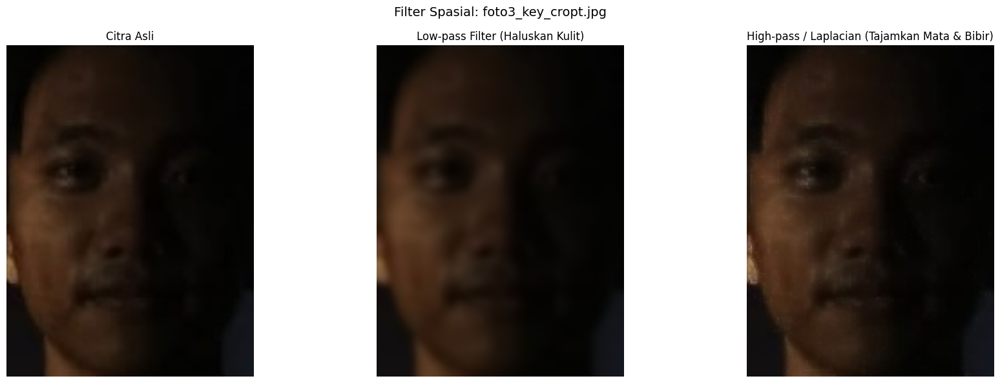

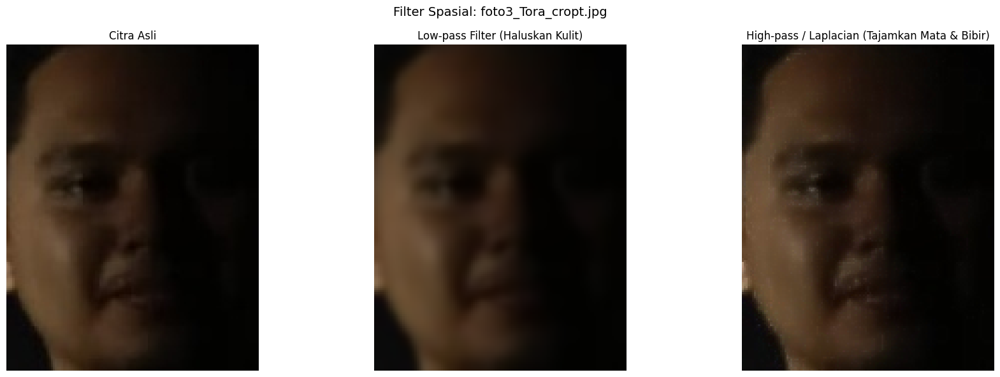

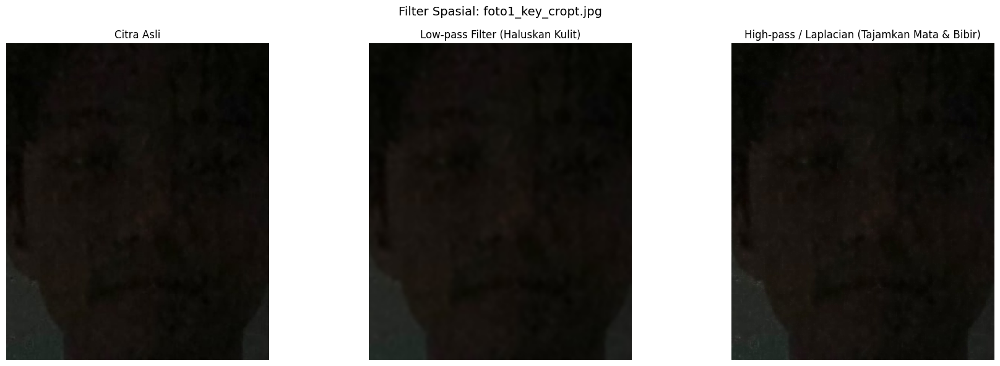

In [ ]:
# ambil semua file gambar di folder
image_paths = glob.glob('/content/drive/MyDrive/Polinema/tugasSemester5/PengolahanCitradanVisiKomputer/Pertemuan 7/cropted/*.*')  # bisa .jpg, .png, dll

# variabel untuk menyimpan hasil filter
low_pass_results = {}
high_pass_results = {}

# loop untuk memproses setiap gambar dalam folder
for path in image_paths:
    filename = os.path.basename(path)  # ambil nama file

    # baca gambar dan ubah ke RGB
    img = cv2.imread(path)
    if img is None:
        print(f"Gagal membaca: {path}")
        continue

    # ubah dari format BGR ke RGB
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # # low-pass filter (menghaluskan kulit)
    low_pass = cv2.GaussianBlur(img_rgb, (9, 9), 0)

    # high-pass / laplacian filter (menajamkan tepi mata dan bibir)
    laplacian = cv2.Laplacian(img_rgb, cv2.CV_64F)
    laplacian = cv2.convertScaleAbs(laplacian)

    # gabungkan citra asli dengan laplacian untuk menajamkan tepi
    sharpened = cv2.addWeighted(img_rgb, 1.0, laplacian, 0.7, 0)

    # Simpan hasil untuk file tertentu
    if "foto2" in filename.lower():
      # Simpan hasil ke variabel
        low_pass_results[filename] = low_pass
        high_pass_results[filename] = sharpened

    # tampilkan hasil perbandingan
    plt.figure(figsize=(18,6))
    plt.suptitle(f"Filter Spasial: {path.split('/')[-1]}", fontsize=14)

    plt.subplot(1,3,1)
    plt.imshow(img_rgb)
    plt.title("Citra Asli")
    plt.axis('off')

    plt.subplot(1,3,2)
    plt.imshow(low_pass)
    plt.title("Low-pass Filter (Haluskan Kulit)")
    plt.axis('off')

    plt.subplot(1,3,3)
    plt.imshow(sharpened)
    plt.title("High-pass / Laplacian (Tajamkan Mata & Bibir)")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

## 6. Implementasikan Floyd–Steinberg Dithering untuk menurunkan kedalaman warna wajah (bit-depth 4–6 bit), lalu analisis bagaimana efeknya terhadap detail dan ekspresi wajah.


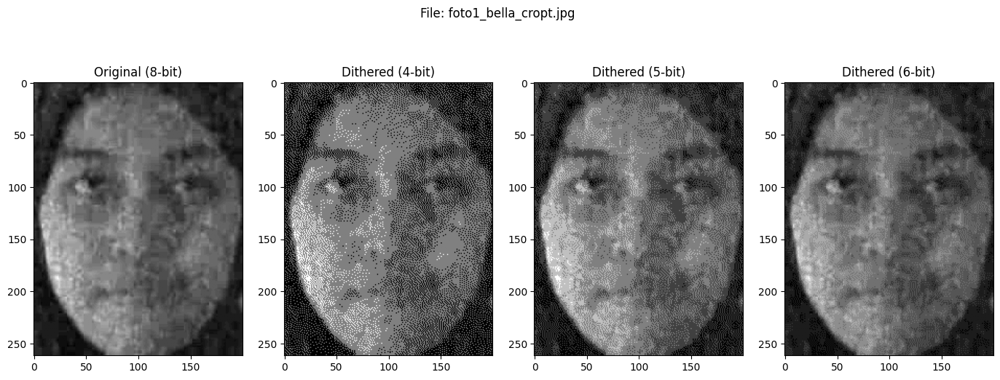

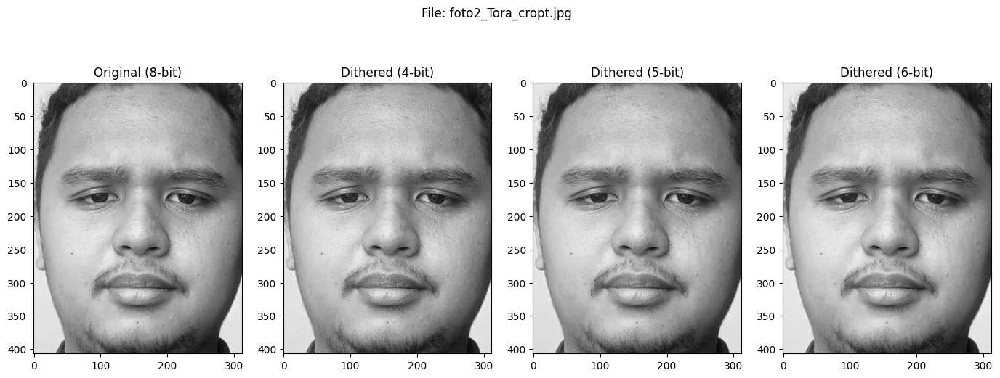

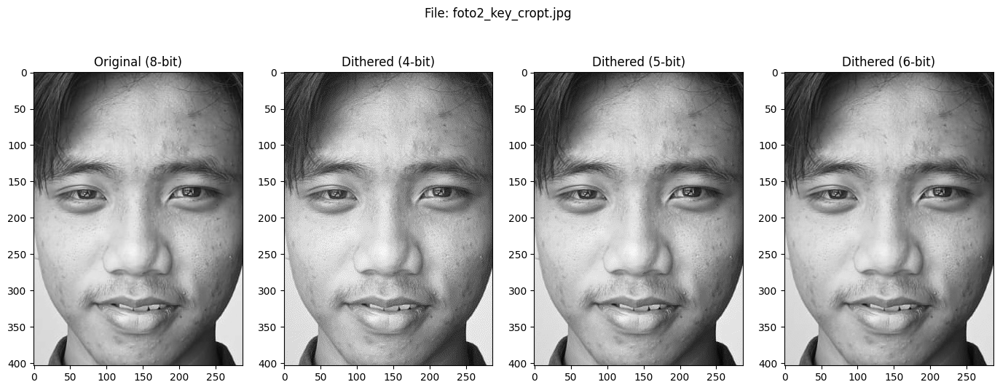

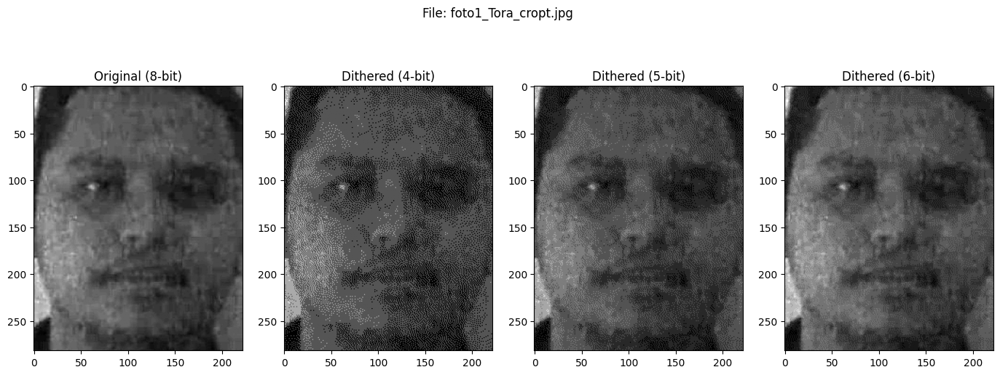

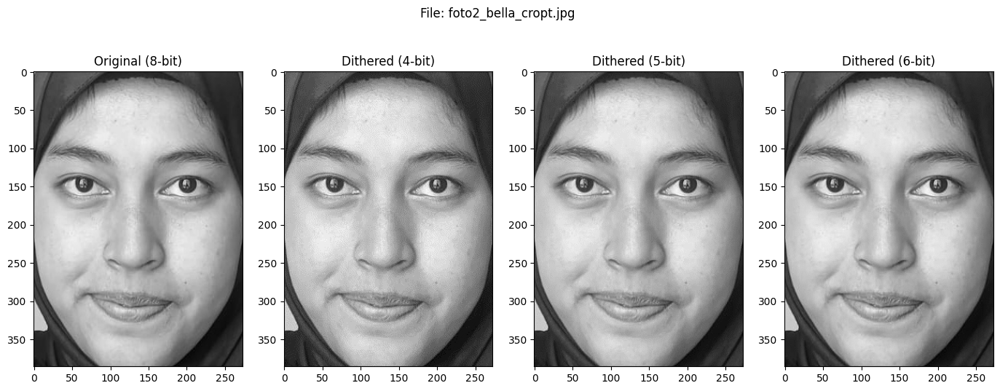

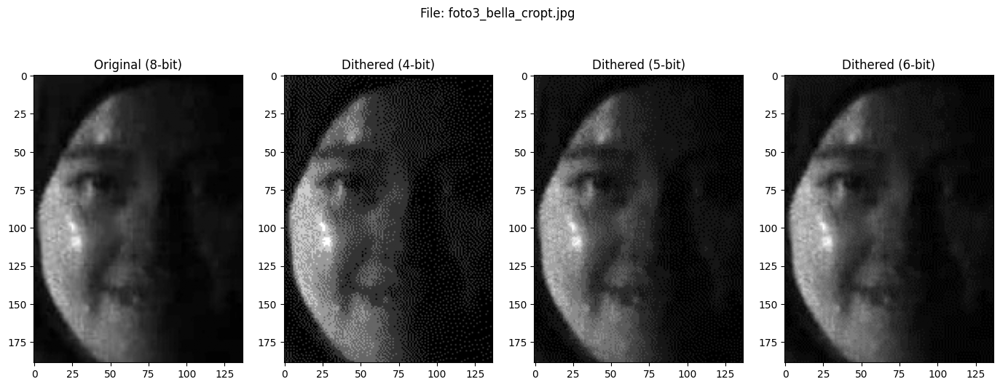

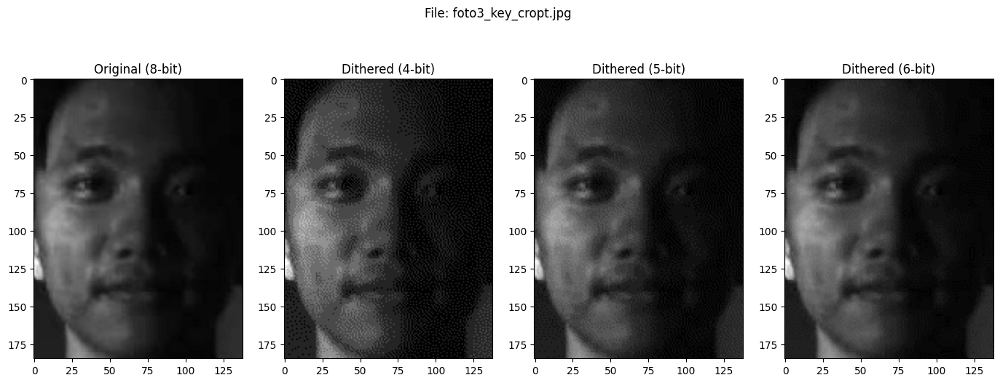

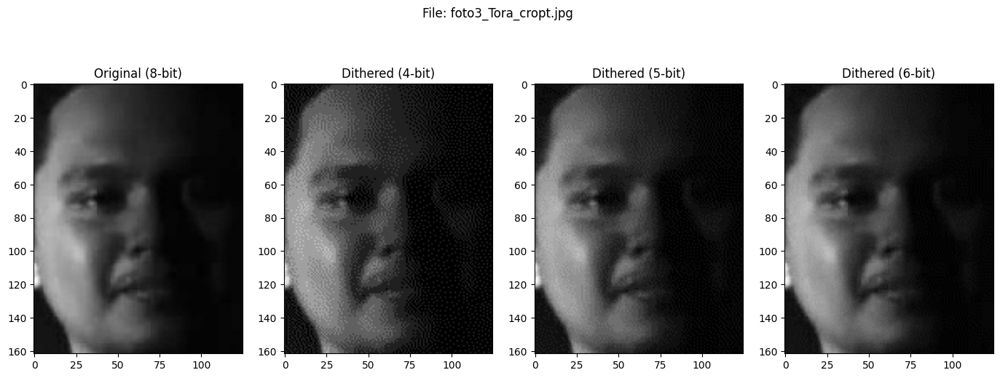

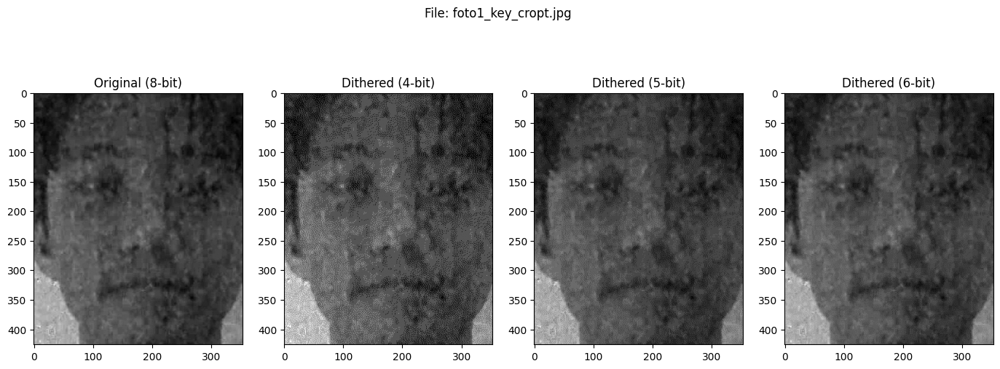

In [ ]:
# folder input berisi citra wajah hasil crop
input_folder = "/content/drive/MyDrive/Polinema/tugasSemester5/PengolahanCitradanVisiKomputer/Pertemuan 7/cropted"
image_paths = glob.glob(input_folder + "/*.*")

# variabel untuk menyimpan hasil dithering
dithering_results = {}

def floyd_steinberg_dithering(img, bit_depth=6):
    # jumlah level berdasarkan bit depth
    # jumlah level keabuan
    levels = 2 ** bit_depth
    # ukuran citra
    h, w = img.shape
    # ubah ke float untuk perhitungan
    output = img.astype(np.float32).copy()

    for y in range(h):
        for x in range(w):
            old_pixel = output[y, x]
            # kuantisasi ke level terdekat
            new_pixel = np.round((old_pixel * (levels - 1)) / 255) * (255 / (levels - 1))
            output[y, x] = new_pixel
            error = old_pixel - new_pixel     # hitung error kuantisasi

            # sebarkan error ke piksel tetangga (cek batas gambar)
            if x+1 < w:
                output[y, x+1] += error * 7/16
            if y+1 < h and x > 0:
                output[y+1, x-1] += error * 3/16
            if y+1 < h:
                output[y+1, x] += error * 5/16
            if y+1 < h and x+1 < w:
                output[y+1, x+1] += error * 1/16

    return np.clip(output, 0, 255).astype(np.uint8)

# proses setiap gambar di folder
for path in image_paths:
    filename = os.path.basename(path)  # ambil nama file (contoh: foto2_1.jpg)

    # baca citra dalam format grayscale
    img_gray = cv2.imread(path, cv2.IMREAD_GRAYSCALE)

    # terapkan dithering dengan bit depth berbeda
    dithered_4bit = floyd_steinberg_dithering(img_gray, bit_depth=4)
    dithered_5bit = floyd_steinberg_dithering(img_gray, bit_depth=5)
    dithered_6bit = floyd_steinberg_dithering(img_gray, bit_depth=6)

    # simpan hasil hanya untuk file dengan nama mengandung "foto2"
    if "foto2" in filename.lower():
       # Simpan hasil untuk PSNR (opsional, tergantung kebutuhan)
        dithering_results[filename] = {
            '4bit': dithered_4bit,
            '5bit': dithered_5bit,
            '6bit': dithered_6bit
        }

    # tampilkan hasil perbandingan
    plt.figure(figsize=(17,6))
    plt.subplot(1,4,1); plt.title("Original (8-bit)"); plt.imshow(img_gray, cmap="gray")
    plt.subplot(1,4,2); plt.title("Dithered (4-bit)"); plt.imshow(dithered_4bit, cmap="gray")
    plt.subplot(1,4,3); plt.title("Dithered (5-bit)"); plt.imshow(dithered_5bit, cmap="gray")
    plt.subplot(1,4,4); plt.title("Dithered (6-bit)"); plt.imshow(dithered_6bit, cmap="gray")
    plt.suptitle(f"File: {path.split('/')[-1]}")
    plt.show()

# Bagian B - Analisis

## 1. Bagaimana perubahan nilai brightness dan contrast memengaruhi hasil histogram wajah gelap?

[bukti analisis](https://drive.google.com/file/d/1mpp8gizNuzs5YYGQGS1EK8qvo0BreYAa/view?usp=drive_link)
- Perubahan nilai brightness dan contrast sangat memengaruhi histogram wajah gelap; menaikkan brightness akan menggeser histogram ke kanan sehingga wajah terlihat lebih terang, sedangkan menurunkan brightness membuat wajah semakin gelap dan detail hilang.

- Sementara itu, meningkatkan contrast akan memperlebar histogram, menonjolkan perbedaan antara area gelap dan terang sehingga fitur wajah lebih jelas, sedangkan menurunkan contrast menyempitkan histogram, membuat citra terlihat flat dan detail sulit dibedakan. Kombinasi brightness dan contrast yang seimbang diperlukan agar wajah gelap tetap terlihat dengan detail yang jelas tanpa kehilangan tonalitas alami.

## 2. Apakah histogram equalization selalu memperbaiki detail wajah? Jelaskan alasannya dengan contoh hasil Anda

[contoh hasil](https://drive.google.com/file/d/1ImFN6gK4_jHrRDF81x7WylF8p_35tGEF/view?usp=drive_link)

Tidak selalu. Histogram Equalization tidak selalu memperbaiki detail wajah — kadang bisa memperjelas, tapi juga bisa membuat wajah tampak terlalu kontras atau tidak alami.

- Pada Gambar kiri: “Original”
  Histogram terpusat di area intensitas menengah (30–220) → ini artinya pencahayaan wajah cukup baik. Detail kulit masih lembut, warna kulit alami, tidak terlalu terang/gelap.
- Pada Gambar kanan: “Equalized”
  Histogram jadi menyebar rata dari 0–255 → pencahayaan global ditingkatkan di seluruh gambar.
  Akibatnya, area gelap (bibir, mata, rambut) jadi makin kontras,
  tapi area terang (kulit, dahi) bisa tampak terlalu tajam atau kasar.

## 3. Bandingkan hasil low-pass dan high-pass filter pada area wajah — bagian mana yang paling terpengaruh?

[hasil percobaan](https://drive.google.com/file/d/16Q3P-tRGECiCAWsu6tvAUJEtUy0va7ve/view?usp=drive_link)

Dari hasil penerapan pada bagian sebelumnya, bagian yang terpengaruh berbeda beda sesuai dengan teknik yang digunakan.

(1) Pada Low-pass Filter (Haluskan Kulit)

➡️ Area paling terpengaruh: kulit di pipi, dahi, dan sekitar hidung (tekstur halus hilang).

➡️ Filter ini berfungsi mengurangi frekuensi tinggi (detail kecil), sehingga:

(-) Kulit wajah tampak lebih lembut dan rata — noise kecil, pori-pori, serta tekstur halus di dahi dan pipi jadi berkurang.

(-) Bagian mata dan bibir sedikit kabur, karena tepi kontrasnya juga ikut terhaluskan.

Maka dari itu, secara visual, wajah tampak lebih “halus” namun sedikit kehilangan ketajaman alami.


(2) Pada High-pass / Laplacian Filter (Tajamkan Mata & Bibir)

➡️ Area paling terpengaruh: tepi mata, alis, bibir, serta kontur wajah bagian luar.


➡️ Filter ini memperkuat tepi (perubahan intensitas tinggi), sehingga:

(-) Mata dan bibir terlihat lebih jelas dan tegas — batas kontrasnya meningkat.

(-) Garis wajah & tekstur kulit kasar juga ikut menonjol, terutama area kerutan atau bayangan.

Maka dari itu, jika terlalu kuat, bisa membuat wajah tampak “keras” atau kontras berlebihan.



## 4. Mengapa proses dithering bisa mempertegas atau justru mengaburkan ekspresi wajah?

Dithering bisa mempertegas ekspresi wajah karena pola titik-titiknya menambah kontras dan ketegasan bayangan, sehingga bentuk wajah lebih jelas.
<br>
Dithering, bisa juga mengaburkan ekspresi jika titik-titiknya terlalu kasar atau rapat, sehingga detail halus wajah hilang dan ekspresi jadi sulit dibaca.

## 5. Berdasarkan hasil percobaan Anda, kombinasi teknik mana yang paling efektif untuk meningkatkan readability fitur wajah sebelum tahap deteksi?

Berdasarkan hasil percobaan, kombinasi penyesuaian brightness dan contrast, diikuti dengan penerapan low-pass filter dan high-pass filter, merupakan teknik yang paling efektif untuk meningkatkan readability fitur wajah sebelum tahap deteksi.

Penyesuaian brightness dan contrast berfungsi menormalkan tingkat pencahayaan agar wajah terlihat natural serta detail pada area gelap maupun terang dapat terlihat dengan jelas. Selanjutnya, low-pass filter membantu menghaluskan tekstur kulit dan mengurangi noise akibat pencahayaan tidak merata. Tahap terakhir menggunakan high-pass atau Laplacian filter mempertegas kontur tepi seperti mata, hidung, dan bibir, sehingga fitur wajah tampak lebih tajam dan mudah dikenali.

Kombinasi ketiga teknik tersebut menghasilkan citra wajah yang bersih, seimbang, dan memiliki kontras optimal, sehingga fitur-fitur utama wajah dapat terbaca dengan jelas oleh sistem face recognition pada tahap selanjutnya.

# Bagian C – Implementasi (Python–OpenCV)

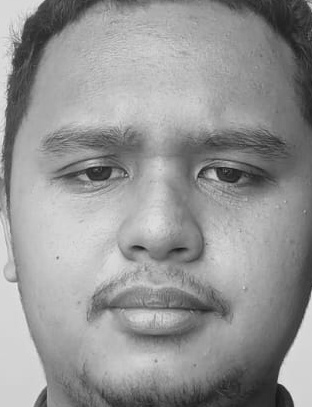

In [ ]:
img = cv2.imread('/content/drive/MyDrive/Tugas Kuliah Sem-5/Computer Vision/Pertemuan-007/Assets/cropted/foto2_Tora_cropt.jpg', cv2.IMREAD_COLOR)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

cv2_imshow(gray)

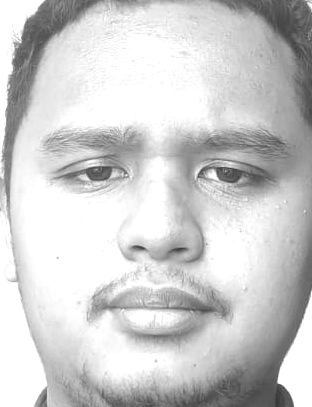

In [ ]:
# Brightness & Contrast
b, a = 30, 1.2
img_bc = cv2.convertScaleAbs(gray, alpha=a, beta=b)

cv2_imshow(img_bc)

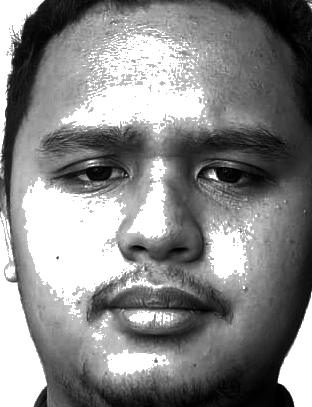

In [ ]:
# Histogram Equalization
img_he = cv2.equalizeHist(img_bc)

cv2_imshow(img_he)

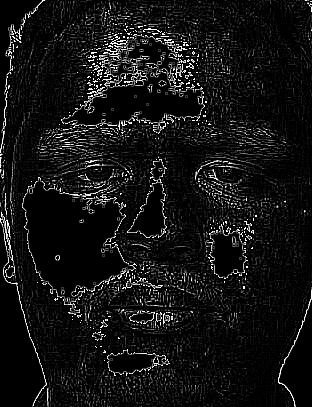

In [ ]:
# Spatial Filtering (contoh High-pass)
kernel_hp = np.array([[-1, -1, -1], [-1, 8, -1], [-1, -1, -1]])
img_hp = cv2.filter2D(img_he, -1, kernel_hp)

cv2_imshow(img_hp)

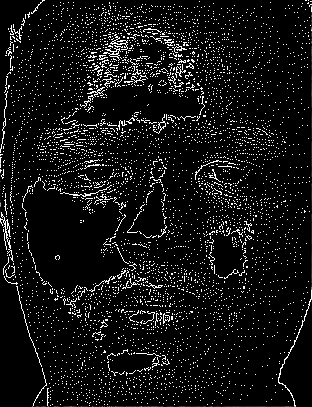

In [ ]:
# Floyd–Steinberg Dithering
img_dither = img_hp.copy().astype(np.float32)
h, w = img_dither.shape

for y in range(h - 1):
    for x in range(1, w - 1):
        old_pixel = img_dither[y, x]
        new_pixel = 255 if old_pixel > 127 else 0
        img_dither[y, x] = new_pixel
        quant_error = old_pixel - new_pixel

        # Sebarkan error ke tetangga
        img_dither[y, x + 1] += quant_error * 7 / 16
        img_dither[y + 1, x - 1] += quant_error * 3 / 16
        img_dither[y + 1, x]     += quant_error * 5 / 16
        img_dither[y + 1, x + 1] += quant_error * 1 / 16

img_dither = np.clip(img_dither, 0, 255).astype(np.uint8)

cv2_imshow(img_dither)

# Bagian D – Analisis Akhir & Kesimpulan

## 1. Urutan proses terbaik untuk menghasilkan wajah paling siap recognition


Berdasarkan hasil pengamatan dan percobaan pada berbagai kondisi pencahayaan, urutan proses terbaik untuk menghasilkan wajah yang paling siap digunakan dalam sistem face recognition adalah sebagai berikut:

1. Face Detection & Cropping → Deteksi dan potong area wajah, fokus hilangkan background.

2. Brightness & Contrast Adjustment → Sesuaikan pencahayaan biar fitur wajah (mata, hidung, bibir) terlihat natural.

3. Histogram Equalization (opsional) → Ratakan distribusi intensitas kalau kontras masih kurang.

4. Low-pass Filtering → Haluskan noise di kulit tanpa hilangkan struktur wajah.

5. High-pass / Laplacian Filtering → Tajamkan tepi dan perjelas kontur fitur wajah.

Kombinasi urutan proses di atas menghasilkan citra wajah dengan pencahayaan seimbang, kontras optimal, dan fitur yang tajam. Dengan kondisi ini, sistem face recognition dapat mengenali wajah dengan akurasi yang lebih tinggi karena fitur-fitur kunci wajah sudah terlihat jelas dan bebas dari gangguan pencahayaan maupun noise.

## 2. Perbandingan nilai PSNR antara citra asli yang memiliki pencahanyaan baik dan hasil pra-pemrosesan

In [ ]:
# === Fungsi bantu ===
def psnr(img1, img2):
    mse = np.mean((img1.astype(np.float32) - img2.astype(np.float32)) ** 2)
    if mse == 0:
        return float('inf')
    PIXEL_MAX = 255.0
    return 20 * np.log10(PIXEL_MAX / np.sqrt(mse))

# def apply_linear(img, a=0.8, b=10):
#     out = a * img.astype(np.float32) + b
#     return np.clip(out, 0, 255).astype(np.uint8)

# def apply_log(img):
#     img_f = img.astype(np.float32)
#     img_norm = img_f / 255.0
#     c = 255 / np.log(1 + np.max(img_norm))
#     out = c * np.log(1 + img_norm)
#     return np.clip(out, 0, 255).astype(np.uint8)

# def equalize_histogram(img):
#     img_yuv = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
#     img_yuv[:,:,0] = cv2.equalizeHist(img_yuv[:,:,0])
#     return cv2.cvtColor(img_yuv, cv2.COLOR_YUV2RGB)

# def low_pass_filter(img):
#     return cv2.GaussianBlur(img, (5,5), 0)

# def high_pass_filter(img):
#     lap = cv2.Laplacian(cv2.cvtColor(img, cv2.COLOR_RGB2GRAY), cv2.CV_64F)
#     lap = cv2.convertScaleAbs(lap)
#     return cv2.addWeighted(img, 1, cv2.cvtColor(lap, cv2.COLOR_GRAY2RGB), 1, 0)

# def floyd_steinberg_dithering(img, bit_depth=6):
#     gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
#     levels = 2 ** bit_depth
#     h, w = gray.shape
#     output = gray.astype(np.float32).copy()

#     for y in range(h):
#         for x in range(w):
#             old_pixel = output[y, x]
#             new_pixel = np.round((old_pixel * (levels - 1)) / 255) * (255 / (levels - 1))
#             output[y, x] = new_pixel
#             error = old_pixel - new_pixel

#             if x+1 < w:
#                 output[y, x+1] += error * 7/16
#             if y+1 < h and x > 0:
#                 output[y+1, x-1] += error * 3/16
#             if y+1 < h:
#                 output[y+1, x] += error * 5/16
#             if y+1 < h and x+1 < w:
#                 output[y+1, x+1] += error * 1/16

#     return np.clip(output, 0, 255).astype(np.uint8)



# === Path folder gambar ===
folder_path = "/content/drive/MyDrive/Polinema/tugasSemester5/PengolahanCitradanVisiKomputer/Pertemuan 7/cropted"

# Ambil hanya file dengan prefix "foto2_"
images = [f for f in os.listdir(folder_path) if f.lower().startswith("foto2_")]

results = []

for filename in images:
    img_path = os.path.join(folder_path, filename)
    img = cv2.imread(img_path)
    if img is None:
        print(f"Gagal membaca {filename}")
        continue
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # === Terapkan berbagai preprocessing ===
    # equalized = equalize_histogram(img_rgb)
    # low_pass = low_pass_filter(img_rgb)
    # high_pass = high_pass_filter(img_rgb)
    # linear_brightness = apply_linear(img_rgb)
    # log_brightness = apply_log(img_rgb)
    # dithering = floyd_steinberg_dithering(img_rgb)

    # === Hitung PSNR terhadap citra asli ===
    psnr_eq = psnr(img_rgb, equalization_results)
    psnr_low = psnr(img_rgb, low_pass)
    psnr_high = psnr(img_rgb, high_pass)
    psnr_linear = psnr(img_rgb, linear_brightness)
    psnr_log = psnr(img_rgb, log_brightness)
    psnr_dith = psnr(cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY), dithering)

    results.append({
        "Nama Gambar": filename,
        "PSNR Linear": psnr_linear,
        "PSNR Log": psnr_log,
        "PSNR Equalized": psnr_eq,
        "PSNR Low-Pass": psnr_low,
        "PSNR High-Pass": psnr_high,
        "PSNR Dithering": psnr_dith
    })

# === Tampilkan hasil dalam tabel ===
df_results = pd.DataFrame(results)
print(tabulate(df_results, headers='keys', tablefmt='psql', showindex=False))

NameError: name 'os' is not defined

## 3. Rekomendasi metode peningkatan kualitas wajah untuk sistem pengenalan wajah real-time

Grayscale → Brightness & Contrast Adjustment → Denoise ringan → Sharpening.

Penjelasan:
- Grayscale menyederhanakan data tanpa kehilangan bentuk wajah.
- Brightness & contrast menormalkan pencahayaan.
- Denoise mengurangi noise kulit.
- Sharpening menegaskan tepi fitur wajah.